<a href="https://colab.research.google.com/github/joeljacson/machine-learning/blob/main/ROAD_CRACK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
files.upload()


Saving Improving_the_Classification_Performance_of_Asphalt_Cracks_After_Earthquake_With_a_New_Feature_Selection_Algorithm.pdf to Improving_the_Classification_Performance_of_Asphalt_Cracks_After_Earthquake_With_a_New_Feature_Selection_Algorithm.pdf


{'Improving_the_Classification_Performance_of_Asphalt_Cracks_After_Earthquake_With_a_New_Feature_Selection_Algorithm.pdf': b'%PDF-1.4\n%\xe2\xe3\xcf\xd3\n1 0 obj\n<</Subtype/XML/Type/Metadata/Length 3692>>stream\n<?xpacket begin="\xef\xbb\xbf" id="W5M0MpCehiHzreSzNTczkc9d"?>\n<x:xmpmeta xmlns:x="adobe:ns:meta/">\n<rdf:RDF xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">\n<rdf:Description rdf:about="" xmlns:dc="http://purl.org/dc/elements/1.1/"><dc:format>application/pdf</dc:format><dc:publisher><rdf:Seq><rdf:li>IEEE</rdf:li></rdf:Seq></dc:publisher><dc:description><rdf:Alt><rdf:li>IEEE Access;2024;12; ;10.1109/ACCESS.2023.3343619</rdf:li></rdf:Alt></dc:description><dc:title><rdf:Alt><rdf:li>Improving the Classification Performance of Asphalt Cracks After Earthquake With a New Feature Selection Algorithm</rdf:li></rdf:Alt></dc:title><dc:subject><rdf:Seq><rdf:li>Classification</rdf:li><rdf:li>deep learning</rdf:li><rdf:li>new asphalt cracks dataset</rdf:li><rdf:li>new feature sel

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Enable inline plots
%matplotlib inline


In [ ]:
!pip install tensorflow numpy matplotlib scikit-learn


In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.applications import VGG16


In [ ]:
import os
from PIL import Image, ImageDraw
import numpy as np

# Paths for dataset
base_dir = "dataset"
train_dir = os.path.join(base_dir, "training")
val_dir = os.path.join(base_dir, "validation")

# Subdirectories for each class
classes = ["Major", "Minor"]

# Create directories
for split in [train_dir, val_dir]:
    for class_name in classes:
        os.makedirs(os.path.join(split, class_name), exist_ok=True)

# Function to generate synthetic images
def generate_images(directory, class_name, num_images, image_size=(224, 224)):
    for i in range(num_images):
        img = Image.new("RGB", image_size, "white")
        draw = ImageDraw.Draw(img)

        # Draw random lines for "cracks"
        num_lines = np.random.randint(5, 15) if class_name == "Major" else np.random.randint(1, 5)
        for _ in range(num_lines):
            x1, y1 = np.random.randint(0, image_size[0]), np.random.randint(0, image_size[1])
            x2, y2 = np.random.randint(0, image_size[0]), np.random.randint(0, image_size[1])
            draw.line((x1, y1, x2, y2), fill="black", width=3)

        # Save the image
        img.save(os.path.join(directory, f"{class_name}_{i+1}.jpg"))

# Generate data
generate_images(os.path.join(train_dir, "Major"), "Major", 200)  # 200 training images for "Major"
generate_images(os.path.join(train_dir, "Minor"), "Minor", 200)  # 200 training images for "Minor"
generate_images(os.path.join(val_dir, "Major"), "Major", 50)     # 50 validation images for "Major"
generate_images(os.path.join(val_dir, "Minor"), "Minor", 50)     # 50 validation images for "Minor"

print(f"Dataset generated at {os.path.abspath(base_dir)}")


Dataset generated at /content/dataset


In [ ]:
import numpy as np
import pandas as pd


In [ ]:
df=pd.read_csv('/content/sample_data/california_housing_test.csv')
df=pd.read_csv('/content/sample_data/california_housing_train.csv')
df=pd.read_csv('/content/sample_data/mnist_test.csv')
df=pd.read_csv('/content/sample_data/mnist_train_small.csv')
df.head()

,6,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,...,0.581,0.582,0.583,0.584,0.585,0.586,0.587,0.588,0.589,0.590
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


from matplotlib import pyplot as plt
_df_0['6'].plot(kind='hist', bins=20, title='6')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['67.1'].plot(kind='hist', bins=20, title='67.1')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['18'].plot(kind='hist', bins=20, title='18')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['0.122'].plot(kind='hist', bins=20, title='0.122')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='6', y='67.1', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='67.1', y='18', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='18', y='0.122', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='0.122', y='0.123', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['0']
  ys = series['6']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_8.sort_values('0', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('0')
_ = plt.ylabel('6')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['0']
  ys = series['0.126']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_9.sort_values('0', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('0')
_ = plt.ylabel('0.126')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['0']
  ys = series['0.127']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('0', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('0')
_ = plt.ylabel('0.127')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['0']
  ys = series['252']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_11.sort_values('0', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('0')
_ = plt.ylabel('252')

from matplotlib import pyplot as plt
_df_12['6'].plot(kind='line', figsize=(8, 4), title='6')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_13['67.1'].plot(kind='line', figsize=(8, 4), title='67.1')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_14['18'].plot(kind='line', figsize=(8, 4), title='18')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_15['0.122'].plot(kind='line', figsize=(8, 4), title='0.122')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
import json

# Specify the path to your JSON file
file_path = '/content/sample_data/anscombe.json'

# Open and load the JSON data
with open(file_path, 'r') as file:
    data = json.load(file)

# Print the loaded data
print(data)


[{'Series': 'I', 'X': 10.0, 'Y': 8.04}, {'Series': 'I', 'X': 8.0, 'Y': 6.95}, {'Series': 'I', 'X': 13.0, 'Y': 7.58}, {'Series': 'I', 'X': 9.0, 'Y': 8.81}, {'Series': 'I', 'X': 11.0, 'Y': 8.33}, {'Series': 'I', 'X': 14.0, 'Y': 9.96}, {'Series': 'I', 'X': 6.0, 'Y': 7.24}, {'Series': 'I', 'X': 4.0, 'Y': 4.26}, {'Series': 'I', 'X': 12.0, 'Y': 10.84}, {'Series': 'I', 'X': 7.0, 'Y': 4.81}, {'Series': 'I', 'X': 5.0, 'Y': 5.68}, {'Series': 'II', 'X': 10.0, 'Y': 9.14}, {'Series': 'II', 'X': 8.0, 'Y': 8.14}, {'Series': 'II', 'X': 13.0, 'Y': 8.74}, {'Series': 'II', 'X': 9.0, 'Y': 8.77}, {'Series': 'II', 'X': 11.0, 'Y': 9.26}, {'Series': 'II', 'X': 14.0, 'Y': 8.1}, {'Series': 'II', 'X': 6.0, 'Y': 6.13}, {'Series': 'II', 'X': 4.0, 'Y': 3.1}, {'Series': 'II', 'X': 12.0, 'Y': 9.13}, {'Series': 'II', 'X': 7.0, 'Y': 7.26}, {'Series': 'II', 'X': 5.0, 'Y': 4.74}, {'Series': 'III', 'X': 10.0, 'Y': 7.46}, {'Series': 'III', 'X': 8.0, 'Y': 6.77}, {'Series': 'III', 'X': 13.0, 'Y': 12.74}, {'Series': 'III', 'X

In [ ]:
import pandas as pd

# Load the dataset (assuming it's a CSV file)
df = pd.read_csv('/content/sample_data/california_housing_test.csv')

# Display the first few rows of the dataset
print(df.head())

# Get basic information about the dataset
print(df.info())

# Describe the dataset to understand summary statistics
print(df.describe())


   longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0    -122.05     37.37                27.0       3885.0           661.0   
1    -118.30     34.26                43.0       1510.0           310.0   
2    -117.81     33.78                27.0       3589.0           507.0   
3    -118.36     33.82                28.0         67.0            15.0   
4    -119.67     36.33                19.0       1241.0           244.0   

   population  households  median_income  median_house_value  
0      1537.0       606.0         6.6085            344700.0  
1       809.0       277.0         3.5990            176500.0  
2      1484.0       495.0         5.7934            270500.0  
3        49.0        11.0         6.1359            330000.0  
4       850.0       237.0         2.9375             81700.0  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------     

In [ ]:
import pandas as pd

# Load the dataset (assuming it's a CSV file)
df = pd.read_csv('/content/sample_data/california_housing_train.csv')

# Display the first few rows of the dataset
print(df.head())

# Get basic information about the dataset
print(df.info())

# Describe the dataset to understand summary statistics
print(df.describe())


   longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0    -114.31     34.19                15.0       5612.0          1283.0   
1    -114.47     34.40                19.0       7650.0          1901.0   
2    -114.56     33.69                17.0        720.0           174.0   
3    -114.57     33.64                14.0       1501.0           337.0   
4    -114.57     33.57                20.0       1454.0           326.0   

   population  households  median_income  median_house_value  
0      1015.0       472.0         1.4936             66900.0  
1      1129.0       463.0         1.8200             80100.0  
2       333.0       117.0         1.6509             85700.0  
3       515.0       226.0         3.1917             73400.0  
4       624.0       262.0         1.9250             65500.0  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------   

In [ ]:
import pandas as pd

# Load the dataset (assuming it's a CSV file)
df = pd.read_csv('/content/sample_data/mnist_test.csv')
df = pd.read_csv('/content/sample_data/mnist_train_small.csv')

# Display the first few rows of the dataset
print(df.head())

# Get basic information about the dataset
print(df.info())

# Describe the dataset to understand summary statistics
print(df.describe())


   6  0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.581  0.582  0.583  \
0  5  0    0    0    0    0    0    0    0    0  ...      0      0      0   
1  7  0    0    0    0    0    0    0    0    0  ...      0      0      0   
2  9  0    0    0    0    0    0    0    0    0  ...      0      0      0   
3  5  0    0    0    0    0    0    0    0    0  ...      0      0      0   
4  2  0    0    0    0    0    0    0    0    0  ...      0      0      0   

   0.584  0.585  0.586  0.587  0.588  0.589  0.590  
0      0      0      0      0      0      0      0  
1      0      0      0      0      0      0      0  
2      0      0      0      0      0      0      0  
3      0      0      0      0      0      0      0  
4      0      0      0      0      0      0      0  

[5 rows x 785 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19999 entries, 0 to 19998
Columns: 785 entries, 6 to 0.590
dtypes: int64(785)
memory usage: 119.8 MB
None
                  6        0      0.1  

In [ ]:
pip install opencv-python numpy matplotlib


In [ ]:
pip install requests pillow numpy


In [ ]:
import requests
from PIL import Image
import numpy as np

# Image URL
url = "https://th.bing.com/th/id/OIP.BkRbzAN0FifEe-kLqtRy4gHaE7?rs=1&pid=ImgDetMain"

# Download the image
response = requests.get(url, stream=True)
response.raise_for_status()  # Ensure the request was successful

# Open the image using Pillow
image = Image.open(response.raw)
image = image.convert("RGB")  # Convert to RGB for consistency
image.show()  # Display the image


In [ ]:
# Convert image to NumPy array
img_array = np.array(image)

# Normalize the array (optional, scale values between 0 and 1)
img_array_float = img_array.astype(float) / 255.0

print("Image data as NumPy array (float):")
print(img_array_float)
print("Array shape:", img_array_float.shape)  # Check the dimensions


Image data as NumPy array (float):
[[[0.4        0.41568627 0.45882353]
  [0.41960784 0.43529412 0.47843137]
  [0.45882353 0.4745098  0.51764706]
  ...
  [0.5372549  0.51372549 0.52941176]
  [0.5254902  0.50196078 0.51764706]
  [0.5254902  0.50196078 0.51764706]]

 [[0.41960784 0.43529412 0.47843137]
  [0.41568627 0.43137255 0.4745098 ]
  [0.43529412 0.45098039 0.49411765]
  ...
  [0.54117647 0.51764706 0.53333333]
  [0.51372549 0.49019608 0.50588235]
  [0.51372549 0.49019608 0.50588235]]

 [[0.43137255 0.44705882 0.49019608]
  [0.40392157 0.41960784 0.4627451 ]
  [0.39607843 0.41176471 0.45490196]
  ...
  [0.48235294 0.45882353 0.4745098 ]
  [0.48235294 0.45882353 0.4745098 ]
  [0.48235294 0.45882353 0.4745098 ]]

 ...

 [[0.54901961 0.51764706 0.50588235]
  [0.50196078 0.47058824 0.45882353]
  [0.38431373 0.35294118 0.34117647]
  ...
  [0.58431373 0.52941176 0.5254902 ]
  [0.36470588 0.30980392 0.30980392]
  [0.45882353 0.40392157 0.40392157]]

 [[0.43529412 0.40392157 0.39215686]
  

In [ ]:
import requests
from PIL import Image
import numpy as np

# Step 1: Download and load the image
url = "https://th.bing.com/th/id/OIP.BkRbzAN0FifEe-kLqtRy4gHaE7?rs=1&pid=ImgDetMain"
response = requests.get(url, stream=True)
response.raise_for_status()
image = Image.open(response.raw).convert("RGB")

# Step 2: Convert to NumPy array and normalize
img_array = np.array(image)
img_array_float = img_array.astype(float) / 255.0

# Step 3: Display information
print("Image data as NumPy array (float):")
print(img_array_float)
print("Array shape:", img_array_float.shape)

# (Optional) Display the image
image.show()


Image data as NumPy array (float):
[[[0.4        0.41568627 0.45882353]
  [0.41960784 0.43529412 0.47843137]
  [0.45882353 0.4745098  0.51764706]
  ...
  [0.5372549  0.51372549 0.52941176]
  [0.5254902  0.50196078 0.51764706]
  [0.5254902  0.50196078 0.51764706]]

 [[0.41960784 0.43529412 0.47843137]
  [0.41568627 0.43137255 0.4745098 ]
  [0.43529412 0.45098039 0.49411765]
  ...
  [0.54117647 0.51764706 0.53333333]
  [0.51372549 0.49019608 0.50588235]
  [0.51372549 0.49019608 0.50588235]]

 [[0.43137255 0.44705882 0.49019608]
  [0.40392157 0.41960784 0.4627451 ]
  [0.39607843 0.41176471 0.45490196]
  ...
  [0.48235294 0.45882353 0.4745098 ]
  [0.48235294 0.45882353 0.4745098 ]
  [0.48235294 0.45882353 0.4745098 ]]

 ...

 [[0.54901961 0.51764706 0.50588235]
  [0.50196078 0.47058824 0.45882353]
  [0.38431373 0.35294118 0.34117647]
  ...
  [0.58431373 0.52941176 0.5254902 ]
  [0.36470588 0.30980392 0.30980392]
  [0.45882353 0.40392157 0.40392157]]

 [[0.43529412 0.40392157 0.39215686]
  

#Edge Detection: Highlights the crack as edges.

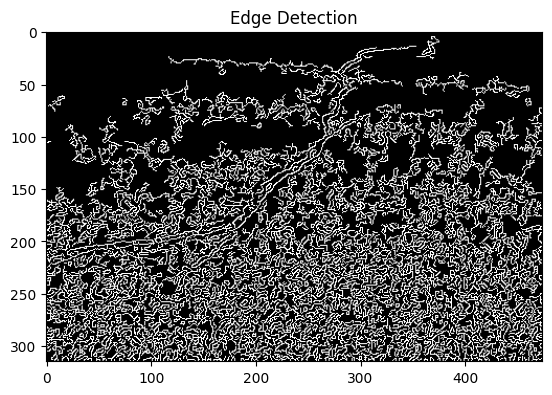

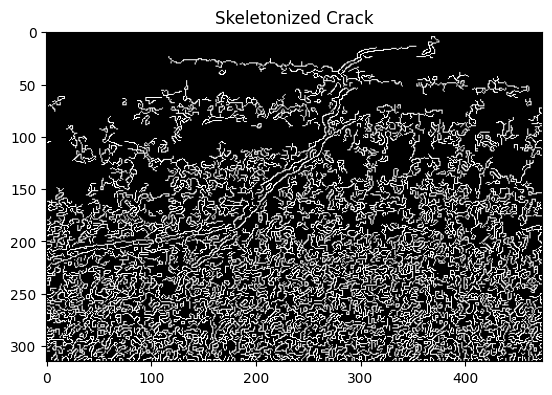

Estimated Crack Length: 247325.92 pixels


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

#Load and Preprocess the Image
# Assuming img_array is the NumPy array of the image (shape: (315, 474, 3))

# Convert RGB to Grayscale
gray_image = cv2.cvtColor((img_array * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)

# Apply Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Detect edges using Canny Edge Detection
edges = cv2.Canny(blurred_image, threshold1=50, threshold2=150)

# Display the processed edge-detected image
plt.imshow(edges, cmap='gray')
plt.title("Edge Detection")
plt.show()

 #Threshold and Skeletonize
 # Threshold the image to binary
_, binary_image = cv2.threshold(edges, 50, 255, cv2.THRESH_BINARY)

# Skeletonize the binary image
skeleton = cv2.ximgproc.thinning(binary_image)

# Display the skeletonized image
plt.imshow(skeleton, cmap='gray')
plt.title("Skeletonized Crack")
plt.show()

#Calculate the Crack Length
# Find the pixels where the crack exists
crack_pixels = np.argwhere(skeleton > 0)

# Calculate the total length using the Euclidean distance between pixels
total_length = 0
for i in range(1, len(crack_pixels)):
    total_length += np.linalg.norm(crack_pixels[i] - crack_pixels[i - 1])

print(f"Estimated Crack Length: {total_length:.2f} pixels")







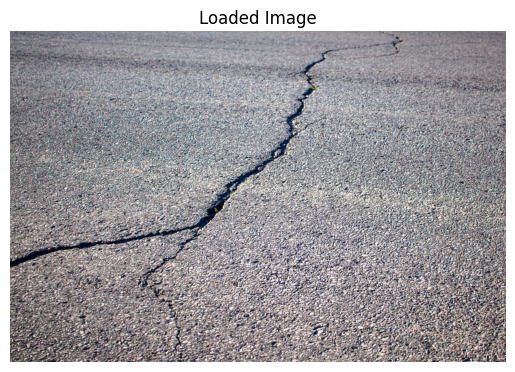

In [ ]:
import numpy as np
import cv2
import requests
from matplotlib import pyplot as plt

# URL of the image
image_url = 'https://www.sunriseasphaltaz.com/wp-content/uploads/2022/09/crack-asphalt-scaled.jpeg'

# Step 1: Download and load the image
response = requests.get(image_url)
image_array = np.asarray(bytearray(response.content), dtype=np.uint8)

# Decode the image into OpenCV format
image_array = cv2.imdecode(image_array, cv2.IMREAD_COLOR)

# Check if image loaded correctly
if image_array is None:
    raise ValueError("Image not loaded properly. Check the URL.")

# Display the image
plt.imshow(cv2.cvtColor(image_array, cv2.COLOR_BGR2RGB))
plt.title("Loaded Image")
plt.axis("off")
plt.show()


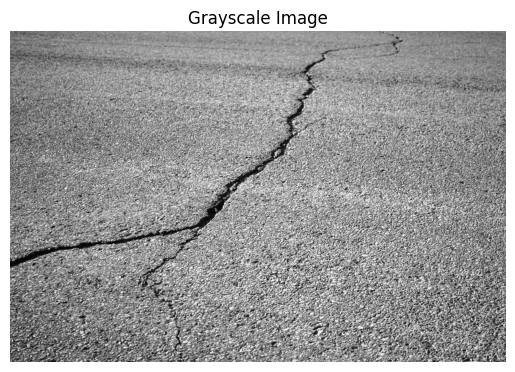

In [ ]:
# Convert the image to grayscale
gray_image = cv2.cvtColor(image_array, cv2.COLOR_BGR2GRAY)

# Display the grayscale image
plt.imshow(gray_image, cmap='gray')
plt.title("Grayscale Image")
plt.axis("off")
plt.show()


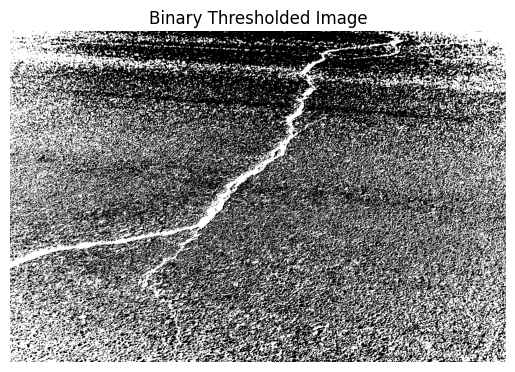

In [ ]:
# Apply Otsu's thresholding
_, binary_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Display the binary (thresholded) image
plt.imshow(binary_image, cmap='gray')
plt.title("Binary Thresholded Image")
plt.axis("off")
plt.show()


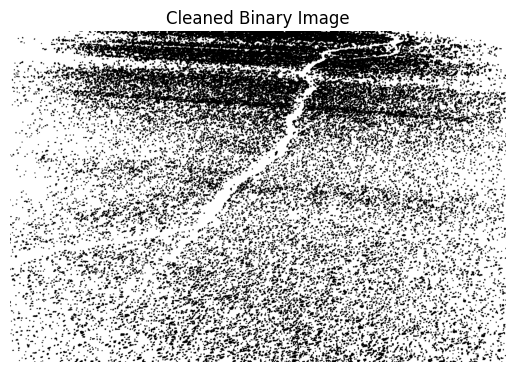

In [ ]:
# Apply morphological cleaning
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
cleaned_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel, iterations=2)

# Display the cleaned binary image
plt.imshow(cleaned_image, cmap='gray')
plt.title("Cleaned Binary Image")
plt.axis("off")
plt.show()


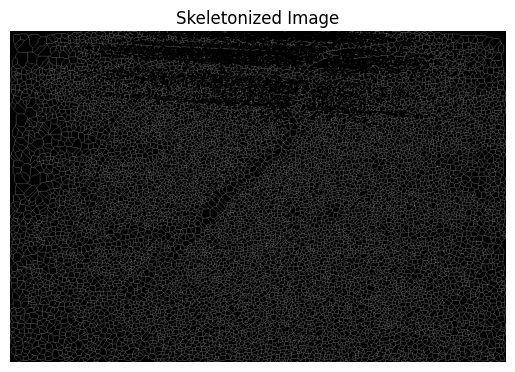

In [ ]:
from skimage.morphology import skeletonize
from skimage import img_as_ubyte

# Skeletonize the binary image
skeleton = skeletonize(cleaned_image // 255)  # Convert to binary for skeletonization
skeleton = img_as_ubyte(skeleton)  # Convert back to uint8 for visualization

# Display the skeletonized image
plt.imshow(skeleton, cmap='gray')
plt.title("Skeletonized Image")
plt.axis("off")
plt.show()


In [ ]:
from skimage.measure import label, regionprops

# Label connected components in the skeletonized image
labeled_image = label(skeleton)

# Measure crack lengths and widths
crack_lengths = []
crack_widths = []

for region in regionprops(labeled_image):
    # Skip small regions (likely noise)
    if region.area < 10:
        continue

    # Crack length (using skeleton perimeter)
    crack_lengths.append(region.perimeter)

    # Crack width (using bounding box dimensions)
    min_row, min_col, max_row, max_col = region.bbox
    crack_widths.append(max(max_row - min_row, max_col - min_col))

# Print measurements
print("Crack Lengths (in pixels):", crack_lengths)
print("Crack Widths (in pixels):", crack_widths)


Crack Lengths (in pixels): [400970.1477308534, 10.863961030678928, 52.00609665440987, 467.4629867976521, 14.035533905932738, 18.27817459305202, 11.82842712474619, 26.65685424949238, 21.621320343559642, 9.207106781186548, 24.242640687119284, 33.10660171779821, 23.071067811865476, 11.863961030678926, 13.863961030678926, 18.071067811865476, 234.2609306503489, 14.242640687119284, 323.44469683442253, 19.727922061357855, 158.01828996322962, 21.44974746830583, 9.242640687119284, 10.414213562373096, 24.106601717798213, 10.863961030678928, 11.414213562373096, 79.11269837220809, 16.035533905932738, 104.2193000900063, 12.278174593052022, 69.42031021678298, 107.49137802864846, 26.65685424949238, 41.520815280171306, 103.31980515339464, 12.621320343559644, 19.27817459305202, 120.6335136523794, 128.01219330881975, 35.72792206135786, 10.82842712474619, 68.698484809835, 56.52081528017131, 8.82842712474619, 60.21320343559643, 30.31370849898476, 37.89949493661167, 19.656854249492383, 43.17766952966369, 2

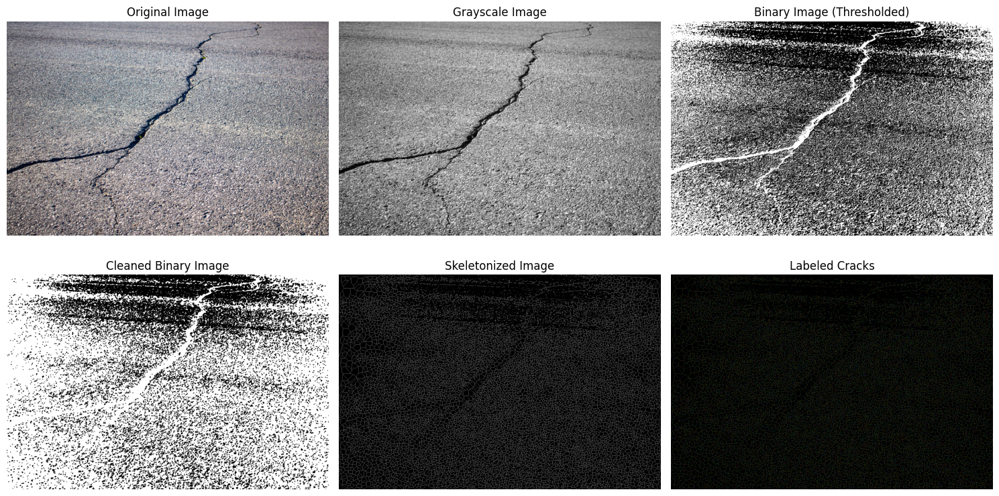

Crack Lengths (in pixels): [400970.1477308534, 10.863961030678928, 52.00609665440987, 467.4629867976521, 14.035533905932738, 18.27817459305202, 11.82842712474619, 26.65685424949238, 21.621320343559642, 9.207106781186548, 24.242640687119284, 33.10660171779821, 23.071067811865476, 11.863961030678926, 13.863961030678926, 18.071067811865476, 234.2609306503489, 14.242640687119284, 323.44469683442253, 19.727922061357855, 158.01828996322962, 21.44974746830583, 9.242640687119284, 10.414213562373096, 24.106601717798213, 10.863961030678928, 11.414213562373096, 79.11269837220809, 16.035533905932738, 104.2193000900063, 12.278174593052022, 69.42031021678298, 107.49137802864846, 26.65685424949238, 41.520815280171306, 103.31980515339464, 12.621320343559644, 19.27817459305202, 120.6335136523794, 128.01219330881975, 35.72792206135786, 10.82842712474619, 68.698484809835, 56.52081528017131, 8.82842712474619, 60.21320343559643, 30.31370849898476, 37.89949493661167, 19.656854249492383, 43.17766952966369, 2

In [ ]:
import numpy as np
import cv2
import requests
from matplotlib import pyplot as plt
from skimage.morphology import skeletonize
from skimage.measure import label, regionprops
from skimage import img_as_ubyte

# Step 1: Load the image from URL
image_url = 'https://www.sunriseasphaltaz.com/wp-content/uploads/2022/09/crack-asphalt-scaled.jpeg'
response = requests.get(image_url)
image_array = np.asarray(bytearray(response.content), dtype=np.uint8)
image_array = cv2.imdecode(image_array, cv2.IMREAD_COLOR)

# Check if image loaded correctly
if image_array is None:
    raise ValueError("Image not loaded properly. Check the URL.")

# Step 2: Convert to grayscale
gray_image = cv2.cvtColor(image_array, cv2.COLOR_BGR2GRAY)

# Step 3: Apply thresholding (Otsu's method)
_, binary_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Step 4: Perform morphological operations to clean noise
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
cleaned_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel, iterations=2)

# Step 5: Skeletonize the cracks
skeleton = skeletonize(cleaned_image // 255)  # Convert to binary for skeletonization
skeleton = img_as_ubyte(skeleton)  # Convert back to uint8 for visualization

# Step 6: Label connected components and measure cracks
labeled_image = label(skeleton)
crack_lengths = []
crack_widths = []

for region in regionprops(labeled_image):
    # Skip small regions (noise)
    if region.area < 10:
        continue
    # Crack length (from skeletonized image)
    crack_lengths.append(region.perimeter)
    # Crack width (bounding box dimensions)
    min_row, min_col, max_row, max_col = region.bbox
    crack_widths.append(max(max_row - min_row, max_col - min_col))

# Visualize each stage of the process
plt.figure(figsize=(15, 8))

# Original image
plt.subplot(2, 3, 1)
plt.title("Original Image")
plt.imshow(cv2.cvtColor(image_array, cv2.COLOR_BGR2RGB))
plt.axis("off")

# Grayscale image
plt.subplot(2, 3, 2)
plt.title("Grayscale Image")
plt.imshow(gray_image, cmap='gray')
plt.axis("off")

# Binary image after thresholding
plt.subplot(2, 3, 3)
plt.title("Binary Image (Thresholded)")
plt.imshow(binary_image, cmap='gray')
plt.axis("off")

# Cleaned binary image
plt.subplot(2, 3, 4)
plt.title("Cleaned Binary Image")
plt.imshow(cleaned_image, cmap='gray')
plt.axis("off")

# Skeletonized image
plt.subplot(2, 3, 5)
plt.title("Skeletonized Image")
plt.imshow(skeleton, cmap='gray')
plt.axis("off")

# Labeled cracks (visualized with random colors)
labeled_vis = np.zeros_like(gray_image)
for region in regionprops(labeled_image):
    for coord in region.coords:
        labeled_vis[coord[0], coord[1]] = np.random.randint(1, 255)

plt.subplot(2, 3, 6)
plt.title("Labeled Cracks")
plt.imshow(labeled_vis, cmap='nipy_spectral')
plt.axis("off")

plt.tight_layout()
plt.show()

# Print crack measurements
print("Crack Lengths (in pixels):", crack_lengths)
print("Crack Widths (in pixels):", crack_widths)


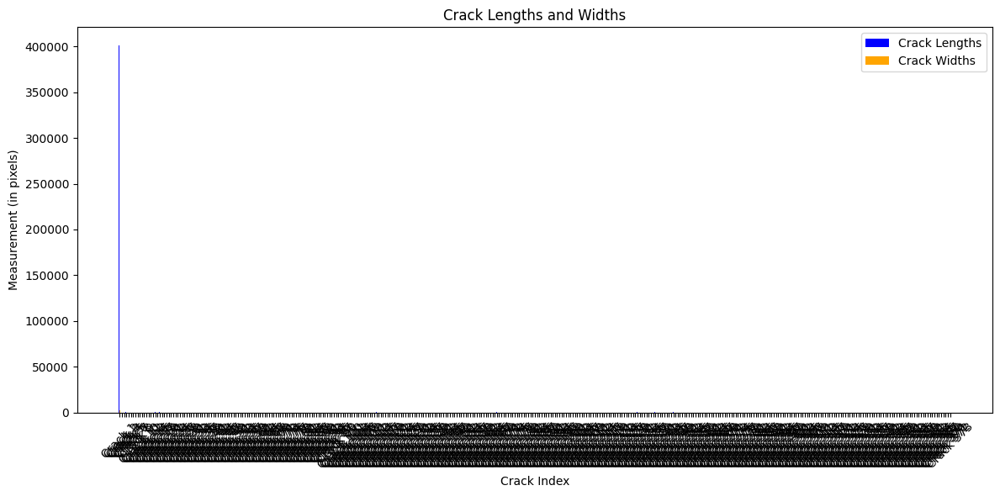

Crack Lengths (in pixels): [400970.1477308534, 10.863961030678928, 52.00609665440987, 467.4629867976521, 14.035533905932738, 18.27817459305202, 11.82842712474619, 26.65685424949238, 21.621320343559642, 9.207106781186548, 24.242640687119284, 33.10660171779821, 23.071067811865476, 11.863961030678926, 13.863961030678926, 18.071067811865476, 234.2609306503489, 14.242640687119284, 323.44469683442253, 19.727922061357855, 158.01828996322962, 21.44974746830583, 9.242640687119284, 10.414213562373096, 24.106601717798213, 10.863961030678928, 11.414213562373096, 79.11269837220809, 16.035533905932738, 104.2193000900063, 12.278174593052022, 69.42031021678298, 107.49137802864846, 26.65685424949238, 41.520815280171306, 103.31980515339464, 12.621320343559644, 19.27817459305202, 120.6335136523794, 128.01219330881975, 35.72792206135786, 10.82842712474619, 68.698484809835, 56.52081528017131, 8.82842712474619, 60.21320343559643, 30.31370849898476, 37.89949493661167, 19.656854249492383, 43.17766952966369, 2

In [ ]:
import numpy as np
import cv2
import requests
from matplotlib import pyplot as plt
from skimage.morphology import skeletonize
from skimage.measure import label, regionprops
from skimage import img_as_ubyte

# Step 1: Load the image from URL
image_url = 'https://www.sunriseasphaltaz.com/wp-content/uploads/2022/09/crack-asphalt-scaled.jpeg'
response = requests.get(image_url)
image_array = np.asarray(bytearray(response.content), dtype=np.uint8)
image_array = cv2.imdecode(image_array, cv2.IMREAD_COLOR)

# Check if image loaded correctly
if image_array is None:
    raise ValueError("Image not loaded properly. Check the URL.")

# Step 2: Convert to grayscale
gray_image = cv2.cvtColor(image_array, cv2.COLOR_BGR2GRAY)

# Step 3: Apply thresholding (Otsu's method)
_, binary_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Step 4: Perform morphological operations to clean noise
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
cleaned_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel, iterations=2)

# Step 5: Skeletonize the cracks
skeleton = skeletonize(cleaned_image // 255)  # Convert to binary for skeletonization
skeleton = img_as_ubyte(skeleton)  # Convert back to uint8 for visualization

# Step 6: Label connected components and measure cracks
labeled_image = label(skeleton)
crack_lengths = []
crack_widths = []

for region in regionprops(labeled_image):
    # Skip small regions (noise)
    if region.area < 10:
        continue
    # Crack length (from skeletonized image)
    crack_lengths.append(region.perimeter)
    # Crack width (bounding box dimensions)
    min_row, min_col, max_row, max_col = region.bbox
    crack_widths.append(max(max_row - min_row, max_col - min_col))

# Step 7: Bar chart visualization
x_labels = [f"Crack {i+1}" for i in range(len(crack_lengths))]

plt.figure(figsize=(12, 6))
bar_width = 0.35
x_indices = np.arange(len(x_labels))

# Bar chart for crack lengths
plt.bar(x_indices, crack_lengths, bar_width, label="Crack Lengths", color="blue")

# Bar chart for crack widths (offset for clarity)
plt.bar(x_indices + bar_width, crack_widths, bar_width, label="Crack Widths", color="orange")

# Adding labels, title, and legend
plt.xlabel("Crack Index")
plt.ylabel("Measurement (in pixels)")
plt.title("Crack Lengths and Widths")
plt.xticks(x_indices + bar_width / 2, x_labels, rotation=45)
plt.legend()
plt.tight_layout()

# Display the bar chart
plt.show()

# Print crack measurements for reference
print("Crack Lengths (in pixels):", crack_lengths)
print("Crack Widths (in pixels):", crack_widths)
